# Particle in a 1D box (in a box ...)
Solve the equation $$\frac{\partial \Psi}{\partial t} = \frac{1}{i\hbar}\left[-\frac{\hbar^2}{2m}\frac{\partial^2}{\partial x^2} + V(x)\right] \psi$$

In [2]:
# install packages if necessary
! pip3 install -U --user numpy scipy tqdm

Requirement already up-to-date: numpy in ./mydata/jupyter_packages/lib/python3.6/site-packages (1.19.1)
Requirement already up-to-date: scipy in ./mydata/jupyter_packages/lib/python3.6/site-packages (1.5.2)
     |████████████████████████████████| 71kB 1.9MB/s eta 0:00:011
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [1]:
import numpy
import math
import tqdm, tqdm.notebook
import scipy.integrate
import scipy.stats, scipy.special
from IPython.display import HTML
from matplotlib import pyplot as plt
import matplotlib.animation as animation
RNG=(-1,1)
PTS = 201
grid = numpy.linspace(RNG[0],RNG[1],PTS)[:-1] # drop last point, which wraps to initial point
deltat = 0.005
twodeltaxsq = 2*((RNG[1]-RNG[0])/(PTS-1))**2

In [2]:
grid

array([-1.  , -0.99, -0.98, -0.97, -0.96, -0.95, -0.94, -0.93, -0.92,
       -0.91, -0.9 , -0.89, -0.88, -0.87, -0.86, -0.85, -0.84, -0.83,
       -0.82, -0.81, -0.8 , -0.79, -0.78, -0.77, -0.76, -0.75, -0.74,
       -0.73, -0.72, -0.71, -0.7 , -0.69, -0.68, -0.67, -0.66, -0.65,
       -0.64, -0.63, -0.62, -0.61, -0.6 , -0.59, -0.58, -0.57, -0.56,
       -0.55, -0.54, -0.53, -0.52, -0.51, -0.5 , -0.49, -0.48, -0.47,
       -0.46, -0.45, -0.44, -0.43, -0.42, -0.41, -0.4 , -0.39, -0.38,
       -0.37, -0.36, -0.35, -0.34, -0.33, -0.32, -0.31, -0.3 , -0.29,
       -0.28, -0.27, -0.26, -0.25, -0.24, -0.23, -0.22, -0.21, -0.2 ,
       -0.19, -0.18, -0.17, -0.16, -0.15, -0.14, -0.13, -0.12, -0.11,
       -0.1 , -0.09, -0.08, -0.07, -0.06, -0.05, -0.04, -0.03, -0.02,
       -0.01,  0.  ,  0.01,  0.02,  0.03,  0.04,  0.05,  0.06,  0.07,
        0.08,  0.09,  0.1 ,  0.11,  0.12,  0.13,  0.14,  0.15,  0.16,
        0.17,  0.18,  0.19,  0.2 ,  0.21,  0.22,  0.23,  0.24,  0.25,
        0.26,  0.27,

In [3]:
# define potential energy
#V = numpy.single(numpy.frompyfunc(lambda x: 20*numpy.sin(x*math.pi/2)**2, 1, 1)(grid))
V = numpy.single(numpy.frompyfunc(lambda x: 100*x**2, 1, 1)(grid))
# returns 
def step(psi, psimin1):
    deriv=numpy.diff(psi,n=2,prepend=psi[-1],append=psi[0])/twodeltaxsq
    #print("psi", psi[:5],psi[-5:])
    #print("deriv", deriv[:5], deriv[-5:])
    #print("delta", (-1.j*(V*psi - deriv/2)*deltat)[:5], (-1.j*(V*psi - deriv/2)*deltat)[-5:])
    return psimin1-1.j*(V*psi - deriv/2)*2*deltat, psi

def steprk2(psi):
    deriv=numpy.diff(psi,n=2,prepend=psi[-1],append=psi[0])/twodeltaxsq
    # midpoint
    psimid = psi-1.j*(V*psi - deriv/2)*deltat/2
    deriv = numpy.diff(psimid,n=2,prepend=psimid[-1],append=psimid[0])/twodeltaxsq
    return psi-1.j*(V*psi - deriv/2)*deltat
    #print("psi", psi[:5],psi[-5:])
    #print("deriv", deriv[:5], deriv[-5:])
    #print("delta", (-1.j*(V*psi - deriv/2)*deltat)[:5], (-1.j*(V*psi - deriv/2)*deltat)[-5:])
    #return psimin1-1.j*(V*psi - deriv/2)*2*deltat, psi
    
def derivpsi(t, psi):
    global V
    deriv=numpy.diff(psi,n=2,prepend=psi[-1],append=psi[0])/twodeltaxsq
    return -1.j*(V*psi - deriv/2)
    
    
#psi=numpy.full(PTS-1, 1.+0j)
psi=numpy.csingle(scipy.stats.norm(scale=0.28).pdf(grid))*numpy.exp(grid*1.j)
# normalize psi
psi /= math.sqrt(sum(psi*psi.conj()).real*(RNG[1]-RNG[0])/(PTS-1))

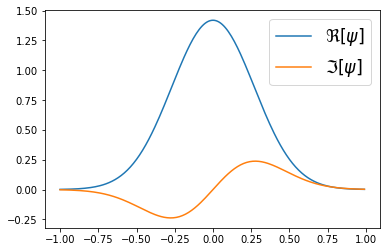

In [4]:
plt.plot(grid, psi.real, label='$\Re[\psi]$')
plt.plot(grid, psi.imag, label='$\Im[\psi]$')
plt.legend(fontsize='xx-large')
plt.show()

Done with integration
Rendering...


RuntimeError: Requested MovieWriter (ffmpeg) not available

  0%|          | 0/100 [00:00<?, ?it/s]


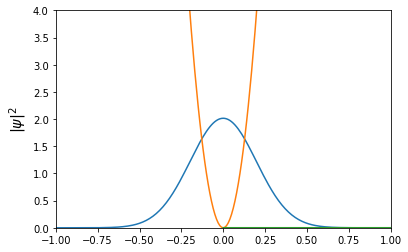

In [6]:
TRNG=(0,5)
fig, ax = plt.subplots()
rk=scipy.integrate.solve_ivp(derivpsi, TRNG, psi, dense_output=True)
print("Done with integration")

def step_generator():
    for s in tqdm.tqdm(numpy.linspace(TRNG[0],TRNG[1],100)):
        #print(f"step {s}")
        yield s
        #psi, psimin1 = step(psi, psimin1)
    
def plotter(data):
    global rk
    ax.clear()
    ax.axis([RNG[0], RNG[1], 0, 4])
    ax.set_ylabel('$|\psi|^2$', fontsize='x-large')
    psii = rk.sol(data)
    return (plt.plot(grid, (psii*psii.conj()).real), 
            plt.plot(grid, V), plt.plot(psi.real))
    #return plt.plot(grid, psi.real), plt.plot(grid, psi.imag)

def init():
    global ax
    ax.ylim(-1,1)
    
print("Rendering...")
ani = animation.FuncAnimation(fig, plotter, step_generator)
from IPython.display import HTML
#ani.save('wobble.mp4', writer=animation.writers['ffmpeg'](fps=2))
HTML(ani.to_jshtml())


In [135]:
rk

  message: 'The solver successfully reached the end of the integration interval.'
     nfev: 65756
     njev: 0
      nlu: 0
      sol: <scipy.integrate._ivp.common.OdeSolution object at 0x7f1f60768bb0>
   status: 0
  success: True
        t: array([0.00000000e+00, 7.53307596e-04, 1.50661519e-03, ...,
       4.99929204e+00, 4.99973567e+00, 5.00000000e+00])
 t_events: None
        y: array([[ 1.30327242e-03-0.00202973j,  8.31640639e-05-0.00060782j,
         1.14576719e-03+0.00046435j, ...,  4.18982295e-03-0.02280997j,
        -1.99464023e-02-0.01261159j, -2.40805353e-02+0.00300237j],
       [ 1.72962787e-03-0.0025788j ,  1.23131402e-03-0.00288327j,
         8.93914348e-05-0.00234603j, ..., -3.40711981e-03+0.02480326j,
         2.02788000e-02+0.01471391j,  2.43472194e-02-0.00062023j],
       [ 2.28083665e-03-0.00325785j,  2.15740414e-03-0.00339606j,
         1.80975149e-03-0.00385628j, ...,  4.73121880e-03-0.02040876j,
        -1.73128202e-02-0.01088446j, -2.09879469e-02+0.00347453j],
  

In [58]:
psi

array([0.49629022, 0.5062147 , 0.51613114, 0.52603139, 0.53590713,
       0.54574994, 0.55555126, 0.56530244, 0.57499474, 0.58461931,
       0.59416727, 0.60362967, 0.61299752, 0.62226179, 0.63141345,
       0.64044349, 0.64934287, 0.65810263, 0.66671381, 0.67516755,
       0.68345505, 0.69156759, 0.69949657, 0.7072335 , 0.71477005,
       0.72209802, 0.72920936, 0.73609625, 0.74275102, 0.74916622,
       0.75533464, 0.76124929, 0.76690343, 0.77229059, 0.77740456,
       0.78223944, 0.78678961, 0.79104977, 0.79501492, 0.79868042,
       0.80204193, 0.80509549, 0.80783747, 0.81026462, 0.81237405,
       0.81416324, 0.81563005, 0.81677273, 0.81758992, 0.81808062,
       0.81824425, 0.81808062, 0.81758992, 0.81677273, 0.81563005,
       0.81416324, 0.81237405, 0.81026462, 0.80783747, 0.80509549,
       0.80204193, 0.79868042, 0.79501492, 0.79104977, 0.78678961,
       0.78223944, 0.77740456, 0.77229059, 0.76690343, 0.76124929,
       0.75533464, 0.74916622, 0.74275102, 0.73609625, 0.72920

In [59]:
sum(psi*psi.conj())*(RNG[1]-RNG[0])/(PTS-1)

1.0000000000000009

In [7]:
#V = numpy.single(numpy.frompyfunc(lambda x: 5. if (-0.7 < x < -0.3 or 0.3 < x < 0.7) else 0, 1, 1)(grid))
V = 500*numpy.power(numpy.cos(math.pi*grid),10)

#psi=numpy.full(PTS-1, 1.+0j)
#psi=numpy.csingle(scipy.stats.norm(scale=0.1).pdf(grid))*numpy.exp(grid*1.j)
psi=numpy.csingle(numpy.frompyfunc(lambda x: 1 if -0.75 < x < -0.25 else 0, 1, 1)(grid))*numpy.exp(grid*10.j)
# normalize psi
psi /= math.sqrt(sum(psi*psi.conj()).real*(RNG[1]-RNG[0])/(PTS-1))

  0%|          | 0/100 [00:00<?, ?it/s]

Done with integration
Rendering...


 99%|█████████▉| 99/100 [00:16<00:00,  5.93it/s]


  0%|          | 0/100 [00:00<?, ?it/s]


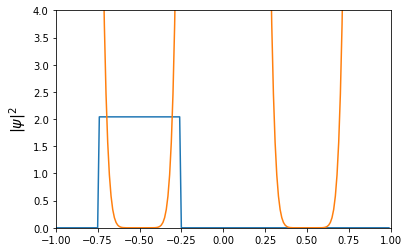

In [8]:
TRNG=(0,10)
fig, ax = plt.subplots()
rk=scipy.integrate.solve_ivp(derivpsi, TRNG, psi, dense_output=True)
print("Done with integration")

def step_generator():
    for s in tqdm.tqdm(numpy.linspace(TRNG[0],TRNG[1],100)):
        #print(f"step {s}")
        yield s
        #psi, psimin1 = step(psi, psimin1)
    
def plotter(data):
    global rk
    ax.clear()
    ax.axis([RNG[0], RNG[1], 0, 4])
    ax.set_ylabel('$|\psi|^2$', fontsize='x-large')
    psii = rk.sol(data)
    return (plt.plot(grid, (psii*psii.conj()).real), 
            plt.plot(grid, V))
    #return plt.plot(grid, psi.real), plt.plot(grid, psi.imag)

def init():
    global ax
    ax.ylim(-1,1)
    
print("Rendering...")
ani = animation.FuncAnimation(fig, plotter, step_generator)
from IPython.display import HTML
#ani.save('wobble.mp4', writer=animation.writers['ffmpeg'](fps=2))
HTML(ani.to_jshtml())

## Wave packet

In [9]:
RNG=(-10,10)
PTS = 501
grid = numpy.linspace(RNG[0],RNG[1],PTS)[:-1] # drop last point, which wraps to initial point
twodeltaxsq = 2*((RNG[1]-RNG[0])/(PTS-1))**2

V = numpy.zeros_like(grid)

#psi=numpy.full(PTS-1, 1.+0j)
#psi=numpy.csingle(scipy.stats.norm(scale=0.1).pdf(grid))*numpy.exp(grid*1.j)
psi=numpy.csingle(scipy.stats.norm(scale=1, loc=-3).pdf(grid))*numpy.exp(grid*10.j)
# normalize psi
psi /= math.sqrt(sum(psi*psi.conj()).real*(RNG[1]-RNG[0])/(PTS-1))

Done with integration
Rendering...


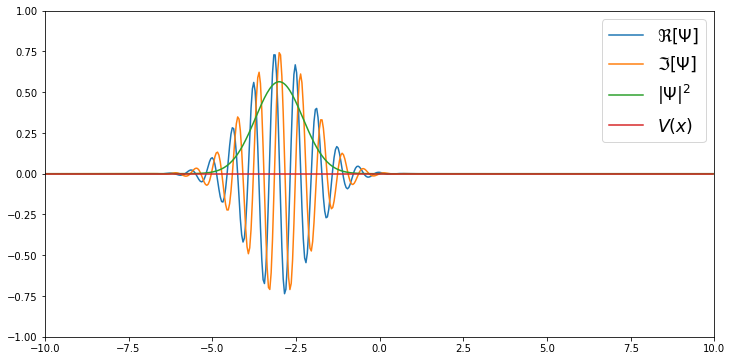

In [11]:
TRNG=(0,1)
fig, ax = plt.subplots(figsize=(12,6))
rk=scipy.integrate.solve_ivp(derivpsi, TRNG, psi, dense_output=True)
print("Done with integration")

def step_generator():
    for s in tqdm.notebook.tqdm(numpy.linspace(TRNG[0],TRNG[1],100)):
        #print(f"step {s}")
        yield s
        #psi, psimin1 = step(psi, psimin1)
    
def plotter(data):
    global rk
    ax.clear()
    ax.axis([RNG[0], RNG[1], -1, 1])
    #ax.set_ylabel('$|\psi|^2$', fontsize='x-large')
    psii = rk.sol(data)
    return (
            plt.plot(grid, psii.real, label='$\Re[\Psi]$'), plt.plot(grid, psii.imag, label='$\Im[\Psi]$'),
            plt.plot(grid,(psii*psii.conj()).real, label='$|\Psi|^2$'),
            plt.plot(grid, V, label='$V(x)$'),
            plt.legend(fontsize='xx-large')
    )
    #return plt.plot(grid, psi.real), plt.plot(grid, psi.imag)

def init():
    global ax
    ax.ylim(-1,1)
    
print("Rendering...")
ani = animation.FuncAnimation(fig, plotter, step_generator)
from IPython.display import HTML
#ani.save('wobble.mp4', writer=animation.writers['ffmpeg'](fps=2))
HTML(ani.to_jshtml())

## Wave packet hitting barrier 

In [12]:
RNG=(-30,30)
PTS = 2001
grid = numpy.linspace(RNG[0],RNG[1],PTS)[:-1] # drop last point, which wraps to initial point
twodeltaxsq = 2*((RNG[1]-RNG[0])/(PTS-1))**2

V = numpy.single(numpy.frompyfunc(lambda x: 6. if (0. < x < 3.) else 0, 1, 1)(grid))
#V = numpy.zeros_like(grid)
#V = 101*(scipy.special.expit(grid*20.) - scipy.special.expit((grid-3)*20.))

#psi=numpy.full(PTS-1, 1.+0j)
#psi=numpy.csingle(scipy.stats.norm(scale=0.1).pdf(grid))*numpy.exp(grid*1.j)
psi=numpy.csingle(scipy.stats.norm(scale=2, loc=-5).pdf(grid))*numpy.exp(grid*5.j)
# normalize psi
psi /= math.sqrt(sum(psi*psi.conj()).real*(RNG[1]-RNG[0])/(PTS-1))

Done with integration
Rendering...


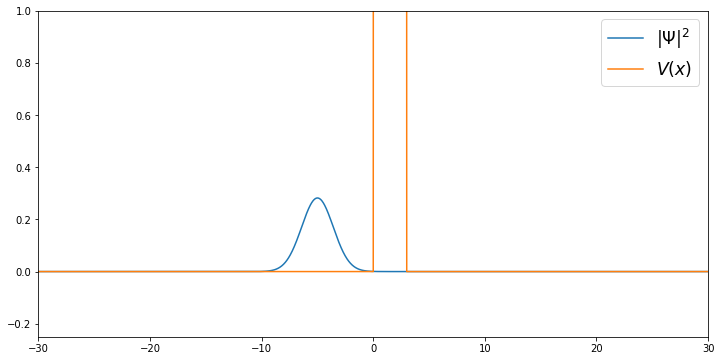

In [15]:
TRNG=(0,10)
fig, ax = plt.subplots(figsize=(12,6))
rk=scipy.integrate.solve_ivp(derivpsi, TRNG, psi, dense_output=True)
print("Done with integration")

def step_generator():
    for s in tqdm.notebook.tqdm(numpy.linspace(TRNG[0],TRNG[1],100)):
        #print(f"step {s}")
        yield s
        #psi, psimin1 = step(psi, psimin1)
    
def plotter(data):
    global rk
    ax.clear()
    ax.axis([RNG[0], RNG[1], -0.25, 1])
    #ax.set_ylabel('$|\psi|^2$', fontsize='x-large')
    psii = rk.sol(data)
    return (
            #plt.plot(grid, psii.real), #plt.plot(grid, psii.imag),
            plt.plot(grid,(psii*psii.conj()).real, label='$|\Psi|^2$'),
            plt.plot(grid, V, label='$V(x)$'),
            plt.legend(fontsize='xx-large')
    )
    #return plt.plot(grid, psi.real), plt.plot(grid, psi.imag)

def init():
    global ax
    ax.ylim(-1,1)
    
print("Rendering...")
ani = animation.FuncAnimation(fig, plotter, step_generator)
from IPython.display import HTML
#ani.save('tunneling.mp4', writer=animation.writers['ffmpeg'](fps=4))
widg=HTML(ani.to_jshtml())
widg

In [20]:
V

array([3.05625564, 3.06464081, 3.07304669, ..., 3.69198498, 3.68209078,
       3.6722198 ])

In [24]:
scipy.special.expit(grid*10)

array([5.14820022e-131, 6.94934341e-131, 9.38063241e-131, ...,
       1.00000000e+000, 1.00000000e+000, 1.00000000e+000])

## Particle in a box

In [16]:
RNG=(-10,10)
PTS = 1001
grid = numpy.linspace(RNG[0],RNG[1],PTS)[:-1] # drop last point, which wraps to initial point
twodeltaxsq = 2*((RNG[1]-RNG[0])/(PTS-1))**2

V = numpy.single(numpy.frompyfunc(lambda x: 10000. if x < -5 or x > 5 else 0, 1, 1)(grid))
#V = numpy.zeros_like(grid)
#V = 101*(scipy.special.expit(grid*20.) - scipy.special.expit((grid-3)*20.))

#psi=numpy.csingle(scipy.stats.norm(scale=2, loc=0).pdf(grid))*numpy.exp(grid*5.j)
psi=numpy.csingle(numpy.frompyfunc(lambda x: math.sin(x/5*8*math.pi) if -5 < x < 5 else 0, 1, 1)(grid))
# normalize psi
psi /= math.sqrt(sum(psi*psi.conj()).real*(RNG[1]-RNG[0])/(PTS-1))

Done with integration
Rendering...


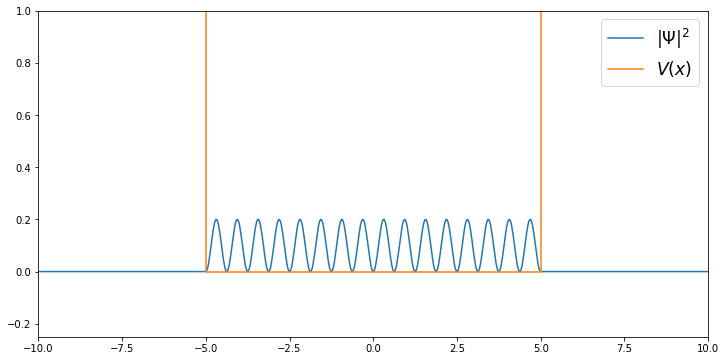

In [17]:
TRNG=(0,5)
fig, ax = plt.subplots(figsize=(12,6))
rk=scipy.integrate.solve_ivp(derivpsi, TRNG, psi, dense_output=True)
print("Done with integration")

def step_generator():
    for s in tqdm.notebook.tqdm(numpy.linspace(TRNG[0],TRNG[1],100)):
        #print(f"step {s}")
        yield s
        #psi, psimin1 = step(psi, psimin1)
    
def plotter(data):
    global rk
    ax.clear()
    ax.axis([RNG[0], RNG[1], -0.25, 1])
    #ax.set_ylabel('$|\psi|^2$', fontsize='x-large')
    psii = rk.sol(data)
    return (
            #plt.plot(grid, psii.real), #plt.plot(grid, psii.imag),
            plt.plot(grid,(psii*psii.conj()).real, label='$|\Psi|^2$'),
            plt.plot(grid, V, label='$V(x)$'),
            plt.legend(fontsize='xx-large')
    )
    #return plt.plot(grid, psi.real), plt.plot(grid, psi.imag)

def init():
    global ax
    ax.ylim(-1,1)
    
print("Rendering...")
ani = animation.FuncAnimation(fig, plotter, step_generator)
from IPython.display import HTML
#ani.save('tunneling.mp4', writer=animation.writers['ffmpeg'](fps=4))
widg=HTML(ani.to_jshtml())
widg